## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---
## Compute the camera calibration using chessboard images

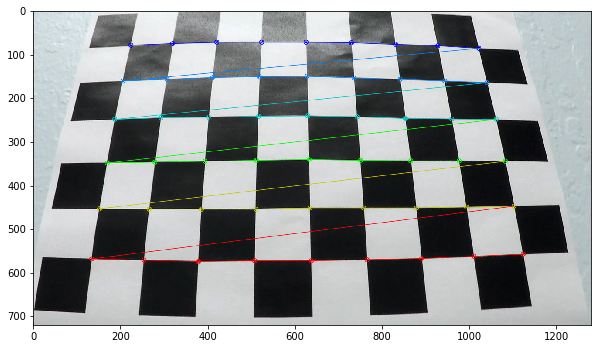

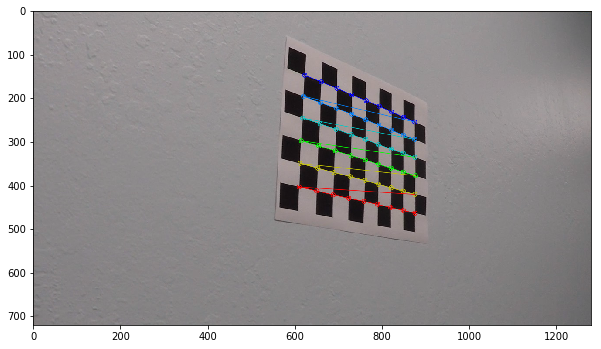

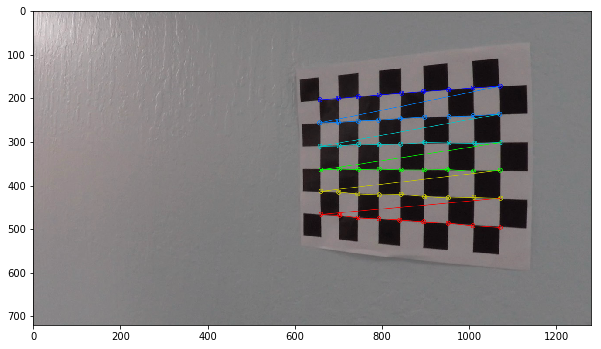

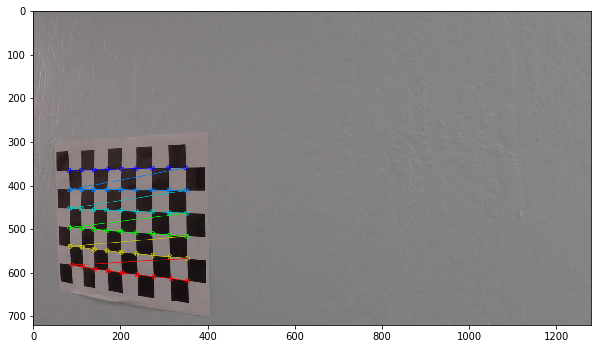

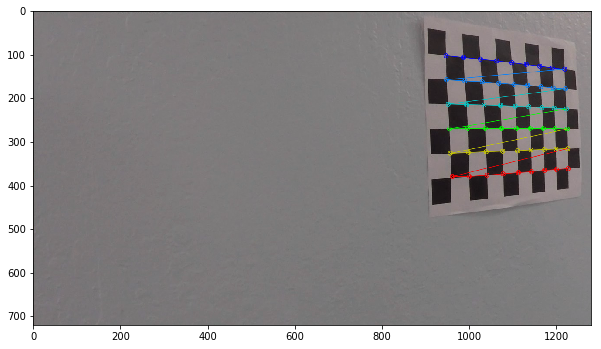

...

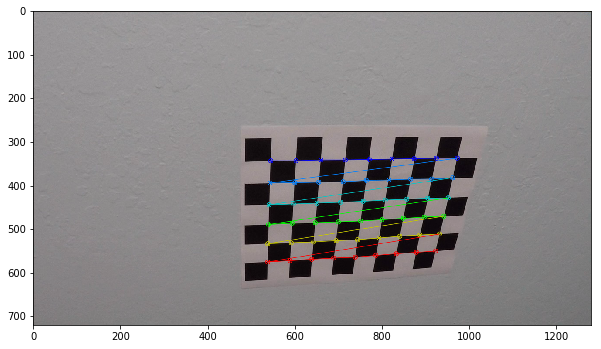

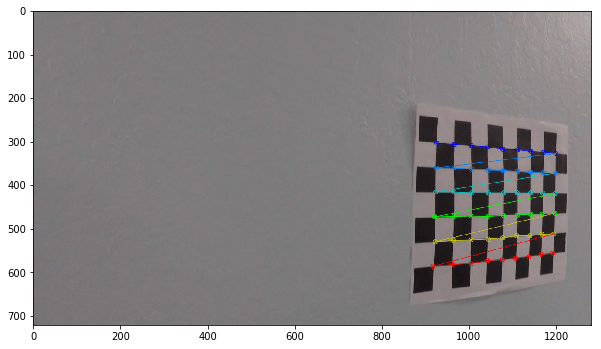

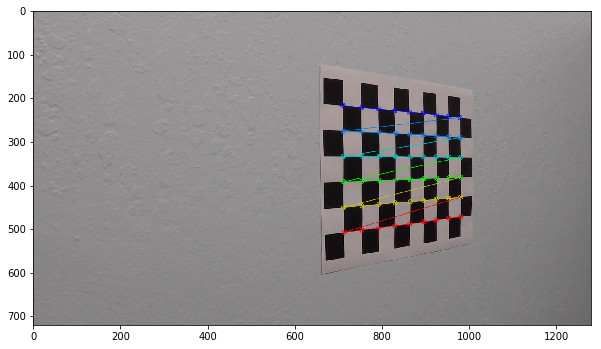

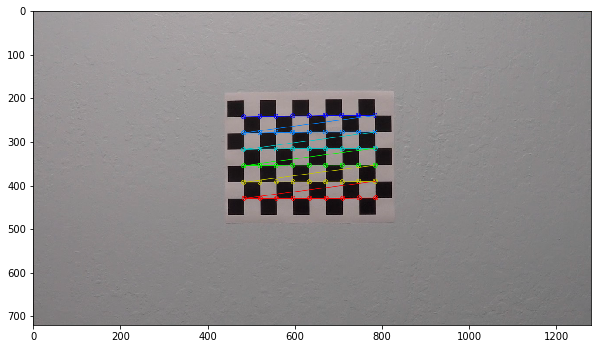

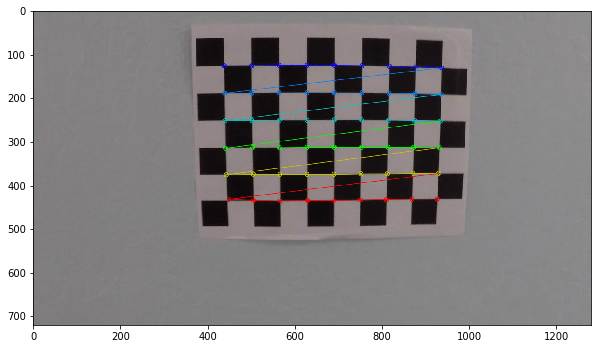

In [78]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# prepare the object points here
nx = 9 # The numbe of inside corners in x
ny = 6 # The number of inside corners in y

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('../camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners
for fname in images:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        img = cv2.drawChessboardCorners(img, (nx, ny), corners, ret)
        #cv2.imshow('img',img)
        #cv2.waitKey(500)
        plt.figure(figsize=(10,10))
        plt.imshow(img)

#cv2.destroyAllWindows()

In [79]:
images = glob.glob('../test_images/*.jpg')

for fname in images:
    img = cv2.imread(fname)
    
    img_size = (img.shape[1], img.shape[0])
    
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)
    
    undist = cv2.undistort(gray, mtx, dist, None, mtx)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
    
    # Check if we get checkboard corners for images in test.
    print(ret, fname)

    # If found, draw corners
    if ret == True:
        # Draw and display the corners
        cv2.drawChessboardCorners(img, (nx, ny), corners, ret)
        plt.imshow(img)

False ../test_images/test1.jpg
False ../test_images/test3.jpg
False ../test_images/straight_lines2.jpg
False ../test_images/test4.jpg
False ../test_images/straight_lines1.jpg
False ../test_images/test5.jpg
False ../test_images/test6.jpg
False ../test_images/test2.jpg


## Apply a distortion correction to raw images
This function takes an image, object points and image points
and performs the camera calibration, image distortion correction
and returns the undistorted image

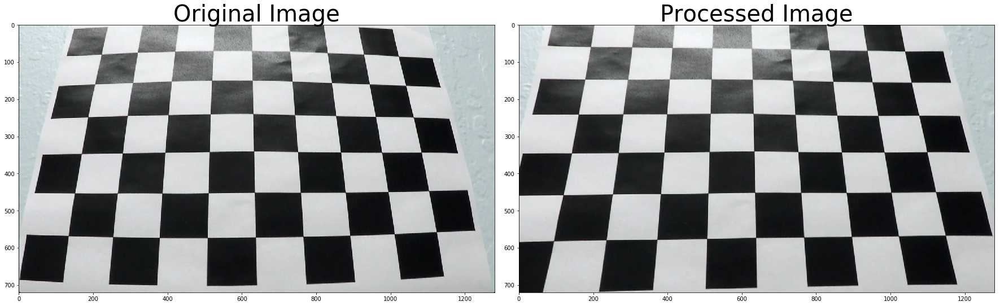

In [114]:
# A utility function for visualising images pre-post some application
def visualise_pre_post(pre_img, post_img, cmap=None):
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(pre_img)
    ax1.set_title('Original Image', fontsize=40)
    ax2.imshow(post_img, cmap=cmap)
    ax2.set_title('Processed Image', fontsize=40)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)


def cal_undistort(img, objpoints=objpoints, imgpoints=imgpoints):
    # Use cv2.calibrateCamera() and cv2.undistort()
    img_size = (img.shape[1], img.shape[0])
    
    # Calibrate out camera here
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)
    
    # undistort the image
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    
    return undist

# lets test this
img = cv2.imread('../camera_cal/calibration3.jpg')
   

# Actually lets put in a test function
undist = cal_undistort(img)
visualise_pre_post(img, undist, cmap='gray')

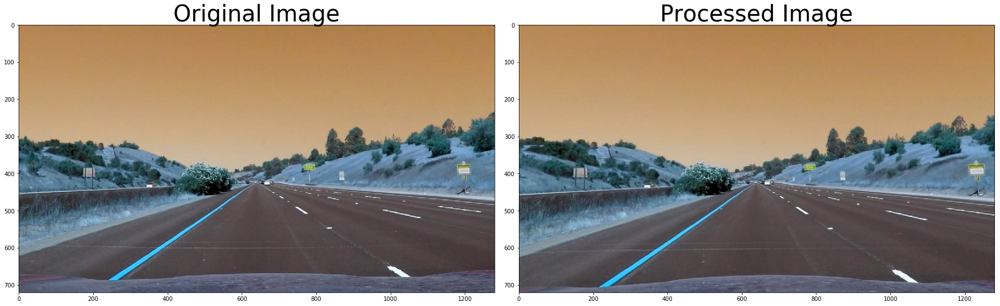

In [115]:
img = cv2.imread('../test_images/straight_lines1.jpg')
undist = cal_undistort(img)
visualise_pre_post(img, undist, cmap='gray')

# Warp image and compute perspective

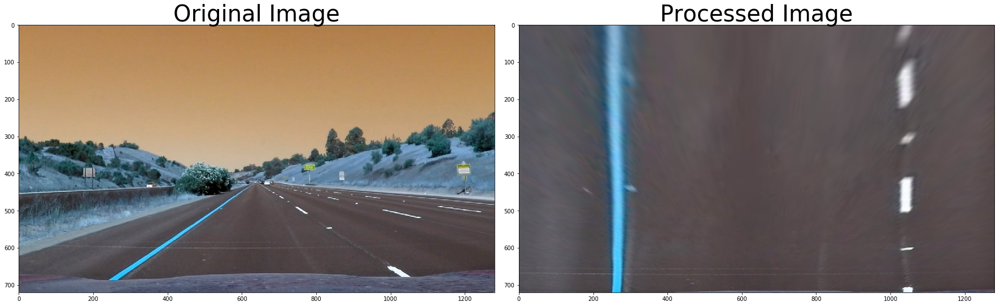

In [132]:
# This function takes an image, number of x and y points,
# camera matrix and distortion coefficients and returns
def warper(img, nx=nx, ny=ny, objpoints=objpoints, imgpoints=imgpoints):
    
    # Use cv2.calibrateCamera() and cv2.undistort()
    img_size = (img.shape[1], img.shape[0])
    
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)
    
    # 1) Use the OpenCV undistort function to remove distortion
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    
    # 2) Convert undistorted image to grayscale
    gray = cv2.cvtColor(undist, cv2.COLOR_BGR2GRAY)
    
    # 3) Search for corners in the grayscale image
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
    
    # Lets dynamically do this
    if ret == True:
        
        # 4) If we find corners, lets visualise them
        cv2.drawChessboardCorners(undist, (nx, ny), corners, ret)
        
        # 5) Choose offset from image corners to plot detected corners
        # THis should be chosen to present the result at the proper aspect
        # I will try 100 used in the course example for now
        offset = 100 
        
        # 6) Grab the image dimensions
        img_size = (gray.shape[1], gray.shape[0])
        
        # 7) For source points we grab the outer four detected corners
        src = np.float32([corners[0], corners[nx-1], corners[-1], corners[-nx]])
        
        # 8) Now we grab the destination points
        dst = np.float32([[offset, offset], [img_size[0]-offset, offset],
                         [img_size[0]-offset, img_size[1]-offset],
                         [offset, img_size[1] - offset]])
        
        # 9) Given src and dst points, compute the perspective and transform matrix
        M = cv2.getPerspectiveTransform(src, dst)
        
        # 10) Warp the image
        warped = cv2.warpPerspective(undist, M, img_size)
    else:
        # Manually set the parameters to source and destination perspectives
        top_left = (555, 455)
        top_right = (725, 455)
        bottom_left = (0, 680)
        bottom_right = (img_size[0], 680)
        src = np.float32([[top_right],[top_left], [bottom_right], [bottom_left]])
        dst = np.float32([[img_size[0],0], [0,0], [img_size[0], img_size[1]], [0, img_size[1]]])
        
        # Compute perspective and transform Matrix
        M = cv2.getPerspectiveTransform(src, dst)
        
        # Warp the image
        warped = cv2.warpPerspective(img, M, img_size)
    # 11) Return the warped image and transform matrix
    return warped, M

# We test our unwarp function here
img = cv2.imread('../test_images/straight_lines1.jpg')
warped, perpestive_M = warper(img, nx=9, ny=6)
visualise_pre_post(img, warped)


## Use Color Transforms, gradients, etc, to create a threshold binary image

# Threshold Gradient

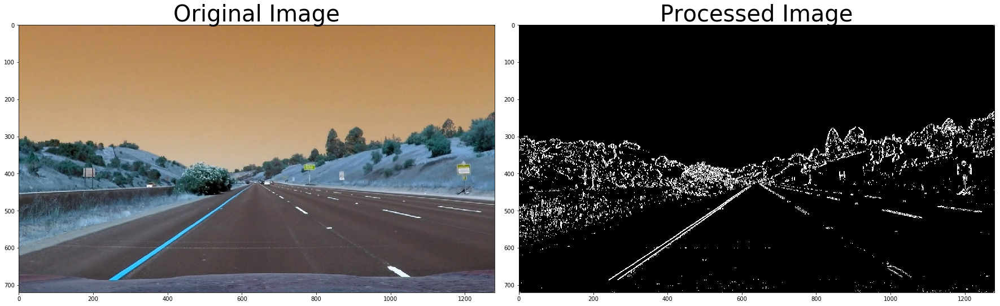

In [133]:
# Define a function that applies Soble x or y
# then takes an absolute value abd applies a threshold.
def abs_sobel_thresh(img, sobel_kernel=3, orient='x', thresh_min=0, thresh_max=255):
    # We systematically apply the following steps to an image
    # 1) Convert to grayscale
    
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    # 2) Take the derivative in x or y given an orientation
    if orient == 'x':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    else:
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    
    # 3) Now take the absolute value of the derivate or gradient
    abs_sobel = np.absolute(sobel)
    
    # 4) Scale to 8-bit (0-255) then convert to type = np.uint8
    abs_sobel = np.uint8(255 * abs_sobel / np.max(abs_sobel))
    
    # 5) Create a max of 1's where the scaled gradient magnitude 
    # is > thresh_min and < thresh_max
    binary_output = np.zeros_like(abs_sobel)
    
    binary_output[(abs_sobel >= thresh_min) & (abs_sobel <= thresh_max)] = 1
    
    # 6) Return this mask as the binary_output image
    return binary_output

# Lets test the function here
grad_binary = abs_sobel_thresh(img, sobel_kernel=3, orient='x', thresh_min=20, thresh_max=100)

img = cv2.imread('../test_images/straight_lines1.jpg')

visualise_pre_post(img, grad_binary, cmap='gray')


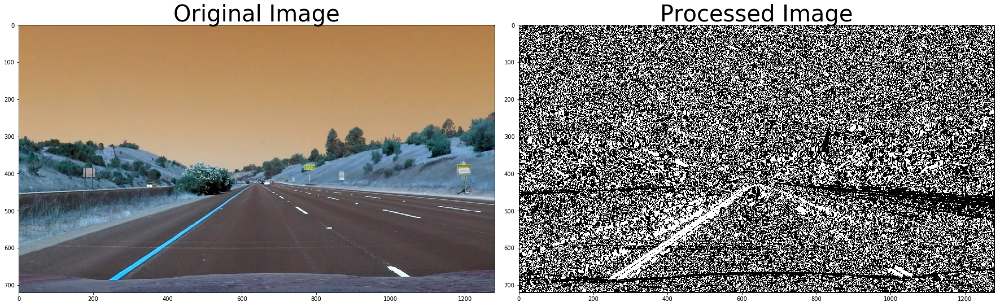

In [134]:
# Here we apply the Sobel operator to x and y axis and then compute the 
# the direction of the gradient and apply a threshold
def dir_threshold(img, sobel_kernel=3, thresh_min=0, thresh_max=np.pi/2):
    """
    Apply the sobel operator, compute the direction of gradient and apply the thresholds
    """
    # We follow some steps for this
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    # 2) Take the gradient in x and y separately
    sobel_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobel_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    
    # 3) Take the absolute value of the x and y gradients
    sobel_abs_x = np.absolute(sobel_x)
    sobel_abs_y = np.absolute(sobel_y)
    
    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to compute the direction of the gradient
    abs_grad_dir = np.arctan2(sobel_abs_y, sobel_abs_x)
        
    # 5) Create a binary mask where direction thresholds are met
    binary_output = np.zeros_like(abs_grad_dir)
    binary_output[(abs_grad_dir >= thresh_min) & (abs_grad_dir <= thresh_max)] = 1
    
    # 6) Return this mask as binary_output of image
    return binary_output

# Lets test out directional threshold
img = cv2.imread('../test_images/straight_lines1.jpg')
dir_binary = dir_threshold(img, sobel_kernel=15, thresh_min=0.7, thresh_max=1.3)
visualise_pre_post(img, dir_binary, cmap='gray')

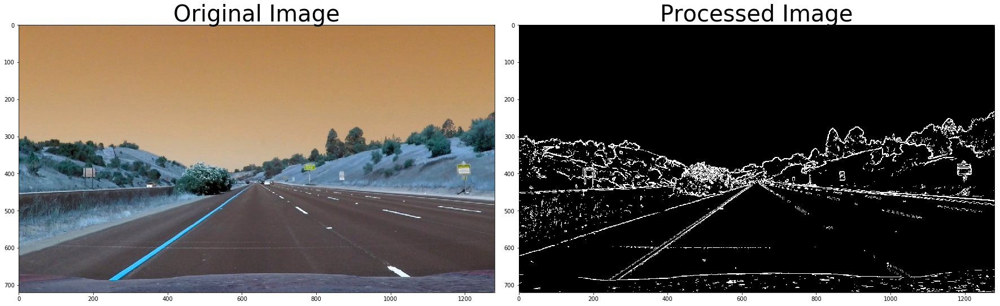

In [135]:
# Here we apply the Sobel operator to both x and y, then compute the 
# magnitude of the gradient and apply a threshold
def mag_threshold(img, sobel_kernel=3, thresh_min=0, thresh_max=255):
    """
    Here we want to apply the Sobel oporator,
    Compute the magnitude of the gradient,
    Then apply the threshold
    """
    # 1) We follow a systematic approach
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    # 2) Take both Sobel x and y gradients
    sobel_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobel_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    
    # 3) Compute the gradient magnitude
    grad_mag = np.sqrt(sobel_x**2 + sobel_y**2)
    
    # 4) Rescale t0 8-bit
    scale_factor = np.max(grad_mag) / 255
    grad_mag = (grad_mag/scale_factor).astype(np.uint8)
    
    # 5) Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(grad_mag)
    
    binary_output[(grad_mag >= thresh_min) & (grad_mag <= thresh_max)] = 1
    
    # 6) Return this mask as the binary_output 
    return binary_output

# We test our function here
img = cv2.imread('../test_images/straight_lines1.jpg')
mag_binary = mag_threshold(img, sobel_kernel=3, thresh_min=30, thresh_max=100)
# Visualise the results
visualise_pre_post(img, mag_binary, cmap='gray')

In [136]:
# Refactor the dir_threshold function to work with our abs_sobel_thresh function

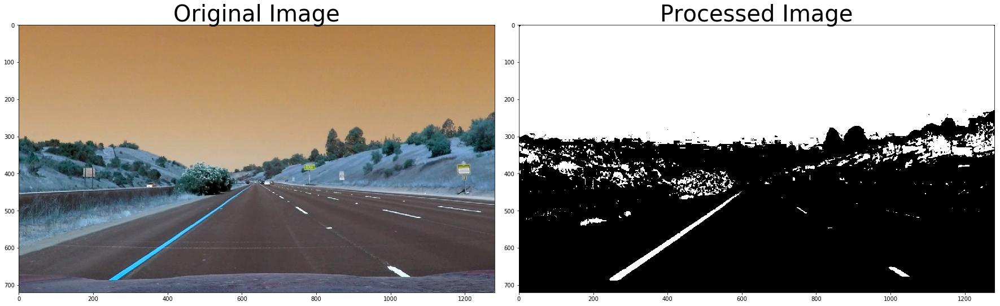

In [137]:
# A color space is a specific organization of colors. They provide a way 
# to categorise colors and represent them in digital images.
# RGB is a red-green-blue one color space. 
# NOte: If you read an image using matplotlib.image.imread() you will get
# an an RGB image but if you use cv2.imread() you get a BGR image.
# HSV is another color space which represents colors in hue, saturation and value.
# HLS is another color space which represents colors in hue, lightness and saturation
# Here we use the HLS color space to detect lane lines different colors and under
# and under different lighting conditions.
# This is good because we know that images are affected by lighting conditions
# This function thresholds the S-Channel HLS
# It uses the exclusive lower bound (>) and inclusive upper (<=)
def hls_select(img, thresh_min=0, thresh_max=255):
    # This function implements the HLS color-space because we want
    # the saturation and lightness using the following steps
    # 1) Convert to HLS color space
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    
    # 2) Apply a threshold to the S channel
    S = hls[:, :, 2]
    binary_output = np.zeros_like(S)
    binary_output[(S > thresh_min) & (S <= thresh_max)] = 1
    
    # 3) Return a binary image or threshold result
    return binary_output

# Lets test drive our HLS color space
img = cv2.imread('../test_images/straight_lines1.jpg')
hls_binary = hls_select(img, thresh_min = 90, thresh_max = 255)

# Lets visualise the results
visualise_pre_post(img, hls_binary, cmap='gray')   

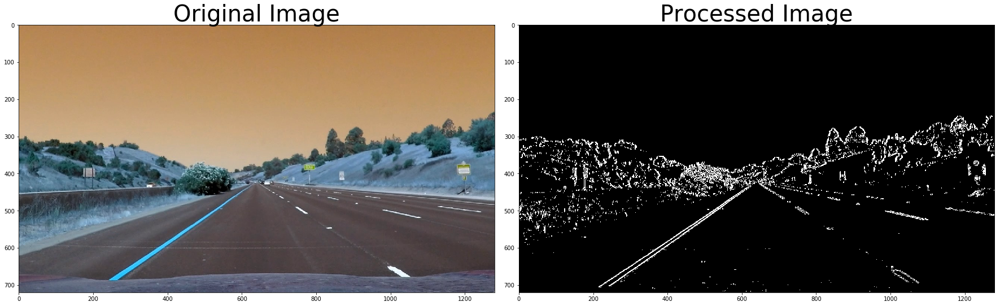

In [157]:
# Combines color threshold and HLS
def pipeline(img, params={'sobel_thresh':(3, 0, 255), 
                          'mag_thresh':(3, 0, 255), 
                          'dir_thresh':(3, 0, 255), 
                          'hls_thresh':(0, 255)}):
    """
    Our pipeline method combines absolute sobel threshold,
    magnitude threshold and directional threshold all in one neat piece of code.
    """
    img = np.copy(img)
    
    # Undistort the image first
    img = cal_undistort(img)
    
    # compute the gradient in x
    grad_x = abs_sobel_thresh(img, orient='x', sobel_kernel=params['sobel_thresh'][0], thresh_min=params['sobel_thresh'][1], thresh_max=params['sobel_thresh'][2])
    
    # compute the gradient in y
    grad_y = abs_sobel_thresh(img, orient='y', sobel_kernel=params['sobel_thresh'][0], thresh_min=params['sobel_thresh'][1], thresh_max=params['sobel_thresh'][2])
    
    # compute the magnitude of gradients 
    mag_binary = mag_threshold(img, sobel_kernel=params['mag_thresh'][0], thresh_min=params['mag_thresh'][1], thresh_max=params['mag_thresh'][2])
    
    # compute gradient direction
    dir_binary = dir_threshold(img, sobel_kernel=params['dir_thresh'][0], thresh_min=params['dir_thresh'][1], thresh_max=params['dir_thresh'][2])
    
    # compute the hue, lightness and saturation
    hls_binary = hls_select(img, thresh_min=params['hls_thresh'][0], thresh_max=params['hls_thresh'][1])
    
    # combine all the above components
    combined = np.zeros_like(dir_binary)
    combined[(grad_x == 1) | ((mag_binary == 1) & (dir_binary == 1) & (hls_binary == 1))] = 1
    
    return combined

params = {'sobel_thresh':(3, 20, 100), 
          'mag_thresh':(3, 30, 100), 
          'dir_thresh':(15, 0.7, 1.3), 
          'hls_thresh':(90, 255)}

# We test the pipeline here ...
img = cv2.imread('../test_images/straight_lines1.jpg')
color_binary = pipeline(img, params)
visualise_pre_post(img, color_binary, cmap='gray')
    

In [161]:
# Now we want to get a binary warped image
def warped(img):
    # We put it throught pipeline
    
    params = {'sobel_thresh':(3, 20, 100), 
          'mag_thresh':(3, 30, 100), 
          'dir_thresh':(15, 0.7, 1.3), 
          'hls_thresh':(90, 255)}
    
    # Now we binary warp it
    combined_binary = pipeline(img, params)
    warped_binary, M = warper(combined_binary)
    
    return warped_binary

# Lets test this warped pipeline
img = cv2.imread('../test_images/straight_lines1.jpg')
warped_binary = warped(img)
visualise_pre_post(img, warped_binary, cmap='gray')

error: /tmp/build/80754af9/opencv_1512491964794/work/modules/imgproc/src/color.cpp:11010: error: (-215) depth == 0 || depth == 2 || depth == 5 in function cvtColor


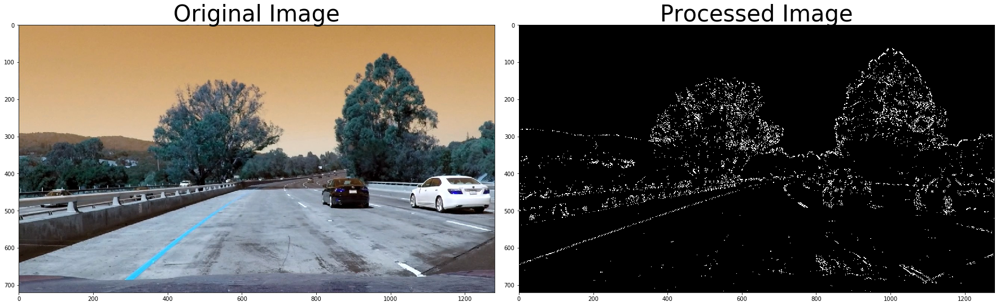

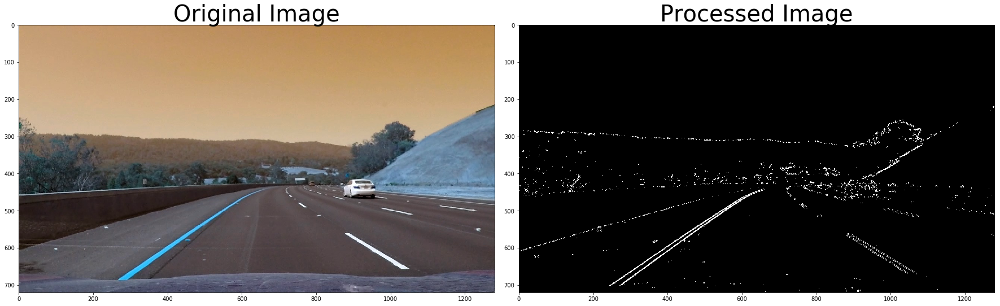

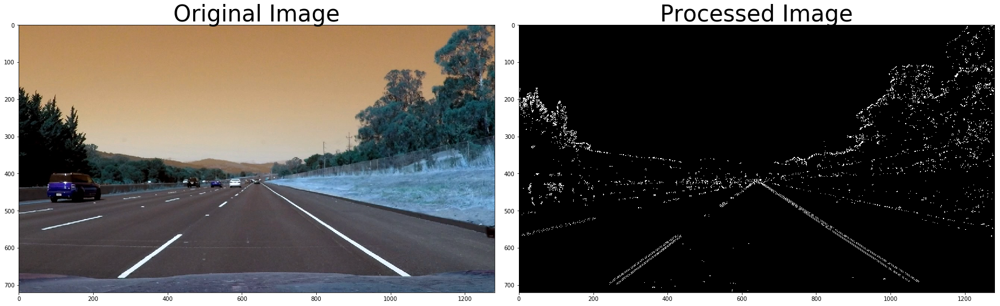

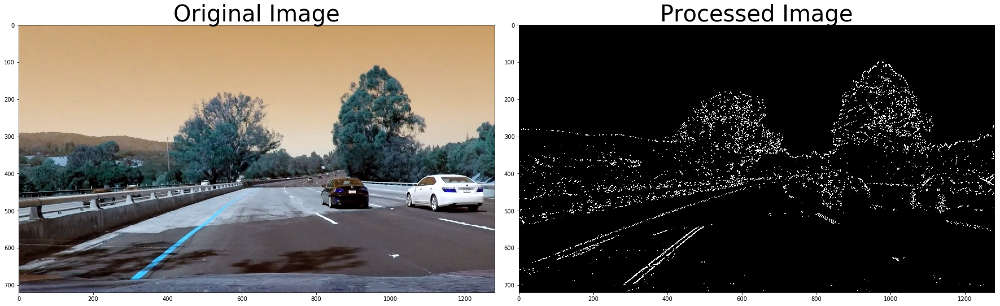

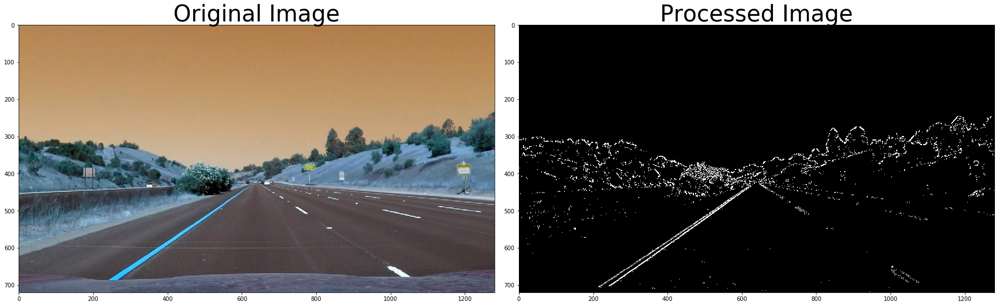

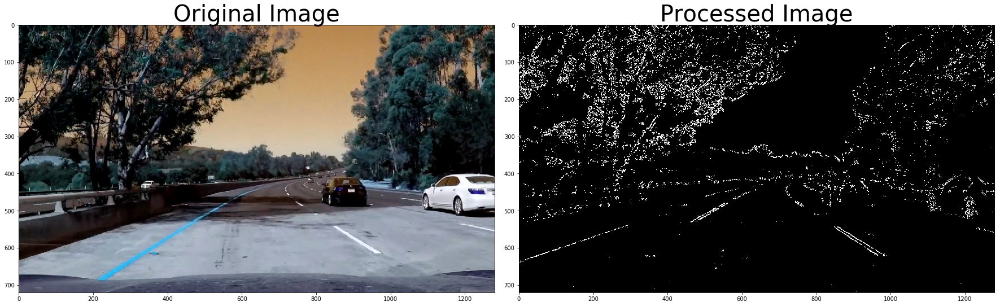

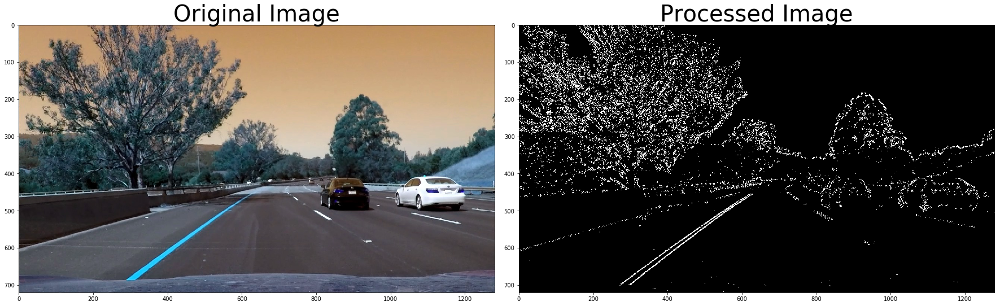

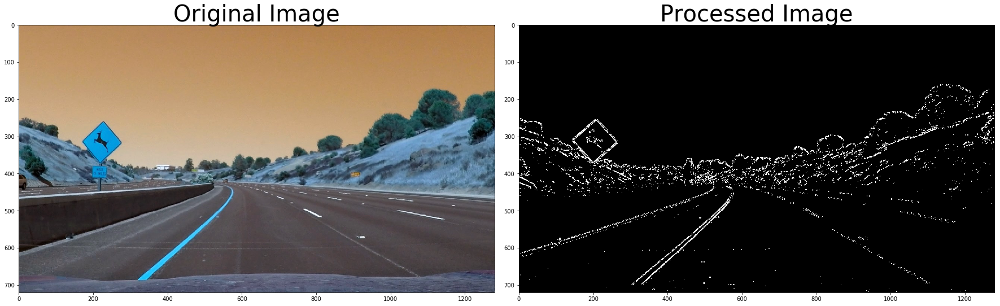

In [39]:
# Lets test drive on a number of images
test_images = glob.glob('../test_images/*.jpg')
for img_path in test_images:
    img = cv2.imread(img_path)
    combined_binary = pipeline(img, params)
    visualise_pre_post(img, combined_binary, cmap='gray')


## Apply a perspective transform to rectify binary image ("bird-eye-view")

## Detect Lane Pixels and fit to the lane boundary

## Determine the curvature of the lane and vehicle position with respect to center

## Warp the detected lane boundaries back onto the original image

## Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position